# Вычислительное музыковедение: Модели и методы Music Data Mining

## Лабораторная работа №2. Акустические признаки и Monophonic Pitch Detection

Подготовьте аудиозапись, с которой будете работать: длительность до 30 секунд, монофоник. Можете воспользоваться сервисом с прошлой ЛР, сделайте midi и экспортируйте wav. Еще можно поиграться с https://vocalremover.org/

In [120]:
import librosa
import numpy as np
import scipy.signal as signal_lib
from IPython.display import Audio
import matplotlib.pyplot as plt

In [121]:


filename = "PrecrasnoyeDalyoko.wav" # ВАШ файл

signal, sr = librosa.load(filename, sr=None)
Audio(signal, rate=sr)

### Акустические признаки [2 балла]

Задание [2 балла]. Найдите в документации библиотеки [librosa](https://librosa.org/doc/latest/index.html) как получить акустические признаки, которые мы прошли на лекции:

1. Спектрограммы
2. Мел-спектрограммы
3. MFCC

Получите их и визуализируйте

In [122]:
filename = "02 - Equation.flac" # ВАШ файл

signal_spec, sr_spec = librosa.load(filename, sr=None, offset=60 * 5 + 20)


In [144]:
Audio(signal_spec, rate=sr_spec)

[Text(0.5, 1.0, 'Spectrogram')]

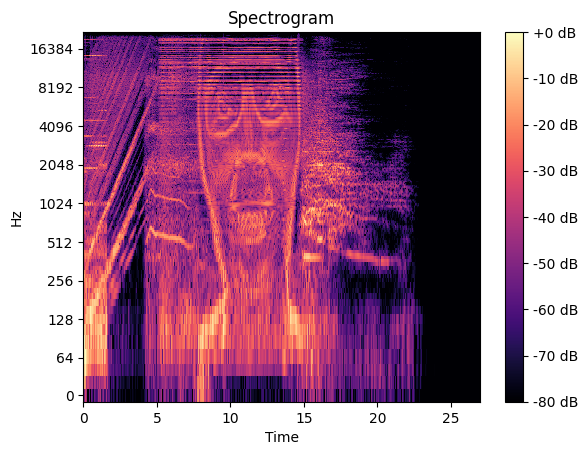

In [123]:
fourier = np.abs(librosa.stft(signal_spec))
fig, ax = plt.subplots()
ampl_to_db = librosa.amplitude_to_db(fourier, ref=np.max)
img = librosa.display.specshow(
    ampl_to_db,
    sr=sr_spec,
    y_axis='log', 
    x_axis='time', 
    ax=ax
)

fig.colorbar(img, ax=ax, format="%+2.0f dB")
ax.set(title='Spectrogram')

[Text(0.5, 1.0, 'Mel spectrogram')]

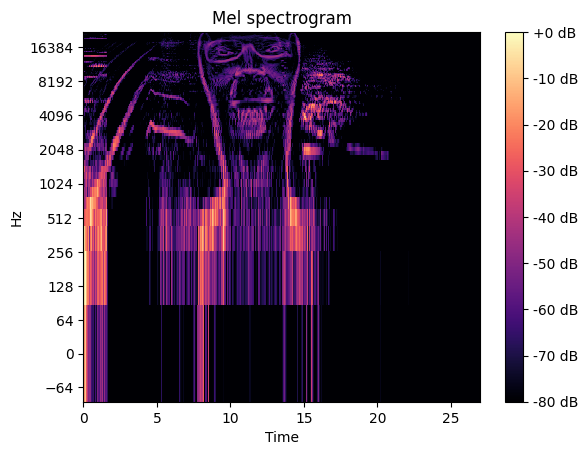

In [124]:
features = librosa.feature.melspectrogram(y=signal_spec, sr=sr_spec, n_mels=128)
fig, ax = plt.subplots()
ampl_to_db = librosa.amplitude_to_db(features, ref=np.max)
img = librosa.display.specshow(
    ampl_to_db,
    sr=sr_spec,
    y_axis='log',
    x_axis='time',
    ax=ax
)

fig.colorbar(img, ax=ax, format="%+2.0f dB")
ax.set(title='Mel spectrogram')

[Text(0.5, 1.0, 'MFCC')]

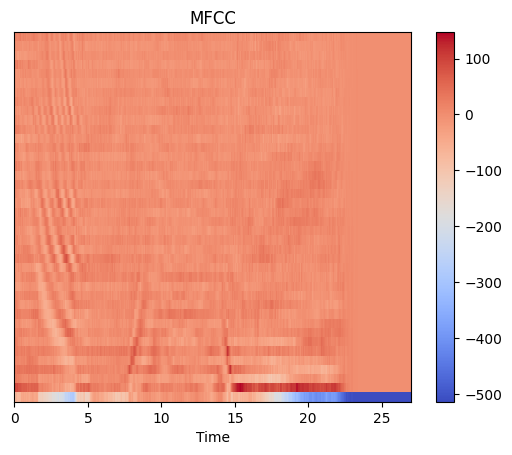

In [125]:
features = librosa.feature.mfcc(y=signal_spec, sr=sr_spec, n_mfcc=40)
fig, ax = plt.subplots()
# ampl_to_db = librosa.amplitude_to_db(features, ref=np.max)
img = librosa.display.specshow(
    features,
    sr=sr_spec,
    x_axis='time',
    ax=ax
)

fig.colorbar(img, ax=ax)
ax.set(title='MFCC')

### Алгоритмы Monophonic Pitch Detection

#### Определение амплитуды [1 балл]

**Энергия и средняя мощность сигналов** ([Источник](https://ru.dsplib.org/content/fourier_transform_energy/fourier_transform_energy.html))  

Пусть дан некоторый сигнал $ s(t) $, который характеризует изменение напряжения или силы тока во времени. Тогда $p(t) = s^2(t)$ будет определять мгновенную мощность.   

Проинтегрируем мгновенную мощность $p(t)$ на некотором интервале времени $\left[t_0, \, t_1\right]$ и получим энергию сигнала на данном интервале:

$$ E = \int_{t_0}^{t_1} p(t)\mathrm{d}t = \int_{t_0}^{t_1} s^2(t)\mathrm{d}t  $$  

Тогда средняя мощность $P_{\textrm{mean}}$ сигнала $s(t)$ на данном интервале времени равна:

$$ P_{\textrm{mean}} = \cfrac{E}{t_1 - t_0} $$

$\sqrt{P_{\textrm{mean}}}$  значение является мерой "среднего" уровня амплитуды сигнала по времени. В электротехнике и акустике RMS значение используется для оценки мощности или амплитуды сигналов.



In [126]:
from numpy import trapz
from math import sqrt

def get_rms_value(frame, sr=48000):
    E = abs(trapz(frame))
    P_mean = E/librosa.get_duration(y=frame, sr=sr)
    A_mean = sqrt(P_mean)
    return A_mean

A_mean = get_rms_value(signal)
print(f"{A_mean=}")

A_mean=0.5268994555182297


#### Pitch detection [6 баллов]

In [127]:
def create_sin(freq,          # частота звучания
               dur=1.0,       # длительность
               sr=44100.0,    # частота дескритизации
               a=1.0,         # амплитуда
               ph = 0.0):     # фаза (сдвиг)
    # Ваш код тут.
    length = sr * dur
    x = np.arange(length)
    y = a * np.sin(2*np.pi*freq*(x/sr) + ph)
    return y

sin_sr = 22000
sin_signal = create_sin(100, dur=1, sr=sin_sr)

**Алгоритм 1. На основе ZRC.**

 [The zero-crossing rate (ZCR)](https://en.wikipedia.org/wiki/Zero-crossing_rate#cite_note-2) это скорость, с которой сигнал изменяется от положительного к нулевому, затем к отрицательному или от отрицательного к нулевому, затем к положительному. Его значение широко используется как в распознавании речи, так и в MIR, являясь ключевым признаком для классификации ударных звуков.


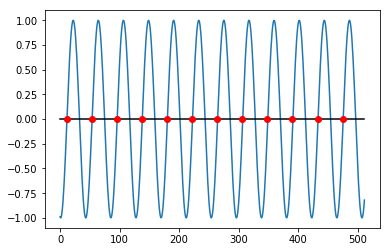

Алгоритм:  
1. ZCR
2. Найти разницу в индексах
3. Найти среднюю разницу
4. Рассчитать высоту в частотах: $\cfrac{f_s}{mean(diffs)}$

In [128]:
def extract_pitch_zcrs(frame, srate):
    indices = np.nonzero((frame[1:] >= 0) & (frame[:-1] < 0))[0]
    pitch = (srate / np.mean(np.diff(indices)))
    return pitch

extract_pitch_zcrs(signal, sr)

633.1480654749556

**Алгоритм 2. На основе FFT.** [2 балла]

1. Посчитать $|FFT(signal)|$
2. Найти максимальную частоту (отсчет) $freq$
3. Перейти от отсчета к самой частоте в Гц: $freq*{f_s}/N$, N - длина $signal$

In [145]:
from numpy.fft import fft
def extract_pitch_fft(frame, srate):
    fft_res_abs = np.abs(fft(a=frame))
    max_freq = np.argmax(fft_res_abs)
    pitch = max_freq * srate/len(frame)
    return pitch

pitch = extract_pitch_fft(signal[:1000], sr)
print(pitch)


144.0


**Алгоритм 3. На основе автокорреляции.** [2 балла]  
1. Посчитать автокорреляцию (используйте numpy -> correlate(..., mode='full'))
2. Берем вторую половину результата (вспоминаем лекцию)
3. Находим lag при котором значение автокор наибольшее (то есть второй пик)
4. Как в Алгоритме 1 на ZCR, находим частоту: srate / max_lag

In [130]:
correlation = np.correlate(sin_signal, sin_signal, mode='full')
mid = len(correlation) // 2
argmax_index_after_mid = np.argmax(correlation[mid+1:])
argmax_index = argmax_index_after_mid + mid + 1
deltas = correlation[mid+2:] - correlation[mid+1:-1]
# find second 
argmax_index_after_mid = np.argmax((deltas[:-1] >= 0) & (deltas[1:] < 0))
sin_sr // argmax_index_after_mid 

100

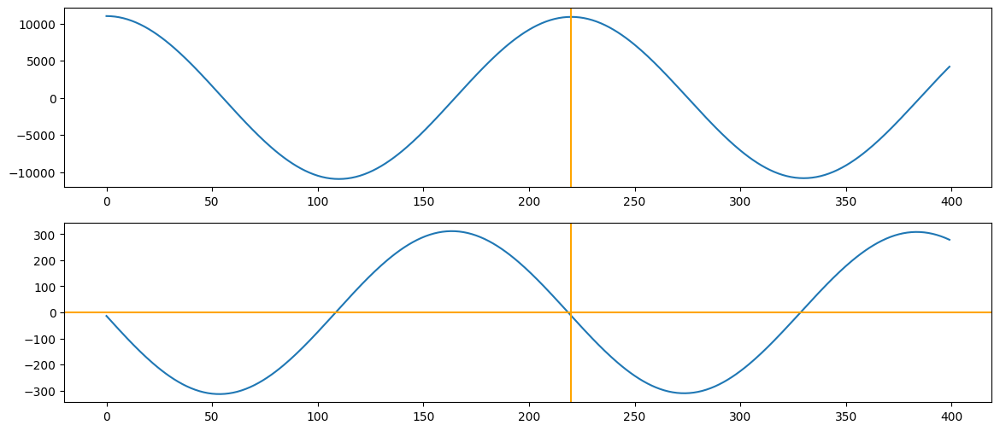

In [131]:
fig, axis = plt.subplots(2, 1, figsize=(14, 6))

axis[0].plot(correlation[mid:mid+400])
axis[1].plot(deltas[:400])
for i in range(2):
    axis[i].axvline(sin_sr/100, c='orange')
axis[1].axhline(c='orange')

Нас интересует, когда correlation достигает локального максимума во второй раз. То есть найдем место, где delta меняется с положительной на отрициательную

In [132]:
def extract_pitch_acr(frame, srate):
    correlation = np.correlate(frame, frame, mode='full')
    mid = len(correlation) // 2
    max_size = srate // 2
    slice = correlation[mid+1:mid+max_size+2]
    deltas = slice[1:] - slice[:-1]
    # find second 
    argmax_index_after_mid = np.argmax((deltas[:-1] >= 0) & (deltas[1:] < 0))

    pitch = srate / argmax_index_after_mid
    return pitch

pitch = extract_pitch_acr(sin_signal, sin_sr)
print(pitch)

100.91743119266054


**Алгоритм 4. AMDF: Average Magnitude Difference Function.** [2 балла]   

AMDF - также сдвигает сигнал, но вместо умножения использует вычитание для определения периодичности как нулевой. Отсутствие умножений делает ее эффективной для микросхем DSP и обработки в реальном времени.

$$ AMDF(m) = \sum_{n=0}^{N-1} |x[n] - x[n+m]|^k $$

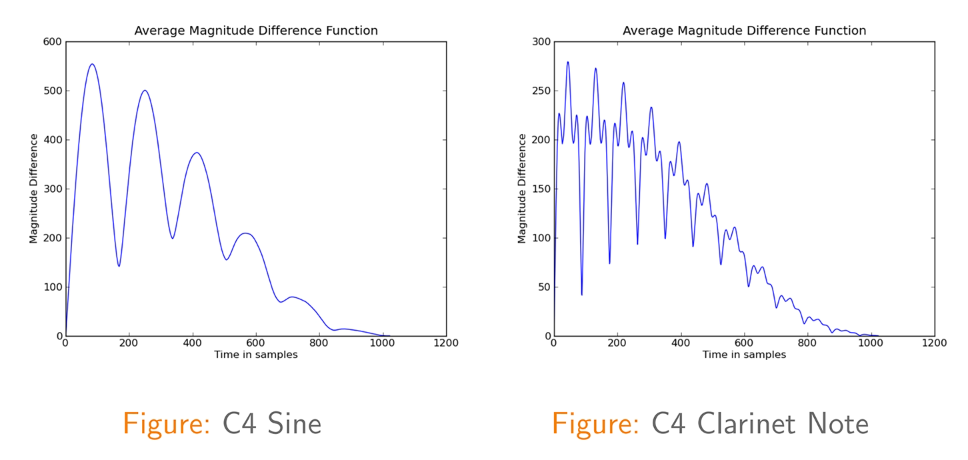

In [133]:
def extract_pitch_amdf(frame, srate):
    N = len(frame)
    pitch = 0
    min_amdf = float('inf')
    for m in range(1, N//2):
        amdf = sum(abs(frame[n] - frame[n+m])**2 for n in range(N-m))
        if amdf < min_amdf:
            min_amdf = amdf
            pitch = srate / m
    return pitch

# pitch = extract_pitch_amdf(sin_signal, sin_sr)
# print(pitch)

#### Собираем все вместе [1 балла]

In [134]:
import numpy as np
import tqdm

def pitch_track(signal,  # сигнал
                srate,   # частота дискр
                hopSize, # сдвиг окна
                winSize, # размер окна
                extractor=extract_pitch_zcrs # экстрактор высоты
                ):
    offsets = np.arange(0, len(signal), hopSize)
    pitch_track = np.zeros(len(offsets))
    amp_track = np.zeros(len(offsets))

    for (m,o) in tqdm.tqdm(enumerate(offsets)):
        frame = signal[o:o+winSize]
        pitch_track[m] = extractor(frame, srate)
        amp_track[m] = get_rms_value(frame)

        if (pitch_track[m] > 1500):
            pitch_track[m] = 0

    return (amp_track, pitch_track)

Реализуйте медианный фильтр [1 балла]

[Медиа́нный фи́льтр](https://ru.wikipedia.org/wiki/%D0%9C%D0%B5%D0%B4%D0%B8%D0%B0%D0%BD%D0%BD%D1%8B%D0%B9_%D1%84%D0%B8%D0%BB%D1%8C%D1%82%D1%80) — один из видов цифровых фильтров, широко используемый в цифровой обработке сигналов и изображений для уменьшения уровня шума. Медианный фильтр является нелинейным КИХ-фильтром.

Значения отсчётов внутри окна фильтра сортируются в порядке возрастания (убывания); и значение, находящееся в середине упорядоченного списка, поступает на выход фильтра. В случае чётного числа отсчётов в окне выходное значение фильтра равно среднему значению двух отсчётов в середине упорядоченного списка. Окно перемещается вдоль фильтруемого сигнала, и вычисления повторяются.

Медианная фильтрация — эффективная процедура обработки сигналов, подверженных воздействию импульсных помех.

Ниже рассматривается пример применения медианного фильтра для одномерного сигнала с окном размером в три отсчёта ко входному массиву x (искусственно введённые продублированные значения показаны полужирно):

x = [2 80 6 3]

    y[1] = медиана[2 2 80] = 2
    y[2] = медиана[2 80 6] = медиана[2 6 80] = 6
    y[3] = медиана[80 6 3] = медиана[3 6 80] = 6
    y[4] = медиана[6 3 3] = медиана[3 3 6] = 3

и в итоге:

y = [2 6 6 3] — выход медианного фильтра

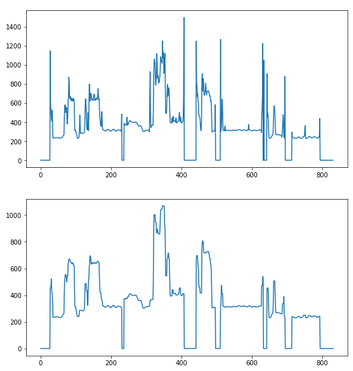

In [135]:
def med_filtr(track, kernel_size=15): # kernel_size - гиперпараметр-окружение
    if kernel_size % 2 != 1:
      raise ValueError('kernel size should be odd number')
    half_len = kernel_size // 2
    result = []
    for mid_index in range(len(track)):
        n_additional_left =  half_len - mid_index
        if n_additional_left >= 0:
            additional_left = [track[0]]*n_additional_left
        else:
            additional_left = []
            
        n_additional_right = mid_index + half_len - (len(track)-1)
        if n_additional_right >= 0:
            additional_right = [track[-1]] *n_additional_right
        else:
            additional_right = []
            
        left_index = max(0, mid_index-half_len)
        right_index = mid_index + half_len + 1
        slice = list(track[left_index:right_index])
        kernel = additional_left + slice + additional_right
        result.append(np.median(kernel))
        
    
    return result

med_filtr(np.array([2, 80, 6, 3]), kernel_size=3)

[2.0, 6.0, 6.0, 3.0]

In [136]:
from scipy.interpolate import interp1d

def sonify(amp_track, pitch_track, srate, hop_size):

    times = np.arange(0.0, float(hop_size * len(pitch_track)) / srate,
                      float(hop_size) / srate)
    sample_times = np.linspace(0, np.max(times), int(np.max(times)*srate-1))
    freq_interpolator = interp1d(times, pitch_track)
    amp_interpolator = interp1d(times, amp_track)
    sample_freqs = freq_interpolator(sample_times)
    sample_amps  = amp_interpolator(sample_times)
    audio = np.zeros(len(sample_times));
    T = 1.0 / srate
    phase = 0.0

    # обновление фаз в соответствии с частотами выборки
    for i in range(1, len(audio)):
        audio[i] = sample_amps[i] * np.sin(phase)
        phase = phase + (2*np.pi*T*sample_freqs[i])

    return audio

zcrs

In [142]:
hop_size = 2048
win_size = hop_size*4
kernel_size=21

amp, pitches_before = pitch_track(signal, sr, hop_size, win_size, extract_pitch_zcrs)

amp = med_filtr(amp, kernel_size=kernel_size) # med_filtr
pitches_after = med_filtr(pitches_before, kernel_size=kernel_size) # med_filtr

audio = sonify(amp, pitches_after, sr, hop_size)
Audio(audio, rate=sr)

295it [00:00, 3104.94it/s]


fft

In [146]:
hop_size = 2048
win_size = hop_size*4
kernel_size=21

amp, pitches_before = pitch_track(signal, sr, hop_size, win_size, extract_pitch_fft)

amp = med_filtr(amp, kernel_size=kernel_size) # med_filtr
pitches_after = med_filtr(pitches_before, kernel_size=kernel_size) # med_filtr

audio = sonify(amp, pitches_after, sr, hop_size)
Audio(audio, rate=sr)

295it [00:00, 1458.32it/s]


autocorrelation

In [138]:
hop_size = 2048
win_size = hop_size*4
kernel_size=21

amp, pitches_before = pitch_track(signal, sr, hop_size, win_size, extract_pitch_acr)

amp = med_filtr(amp, kernel_size=kernel_size) # med_filtr
pitches_after = med_filtr(pitches_before, kernel_size=kernel_size) # med_filtr

audio = sonify(amp, pitches_after, sr, hop_size)
Audio(audio, rate=sr)

295it [00:03, 95.34it/s] 


amdf

In [147]:
def extract_pitch_amdf(frame, srate, min_f = 100):
    N = len(frame)
    amdf = np.zeros(N)
    for i in range(N):
        amdf[i] = np.sum(np.abs(frame[:N-i] - frame[i:]))
    first_max = np.where(np.diff(amdf) < 0)[0][0]
    lag = np.argmin(amdf[first_max:round(srate/min_f)]) + first_max
    pitch = srate/lag
    #plt.plot(amdf); #plt.show(); 
    #print("Minimal lag:", lag)
    return pitch

pitch = extract_pitch_amdf(sin_signal, sin_sr)
print(pitch)


100.45662100456622


In [148]:
hop_size = 2048
win_size = hop_size*4
kernel_size=21

amp, pitches_before = pitch_track(signal, sr, hop_size, win_size, extract_pitch_amdf)

amp = med_filtr(amp, kernel_size=kernel_size) # med_filtr
pitches_after = med_filtr(pitches_before, kernel_size=kernel_size) # med_filtr

audio = sonify(amp, pitches_after, sr, hop_size)
Audio(audio, rate=sr)

295it [00:50,  5.90it/s]


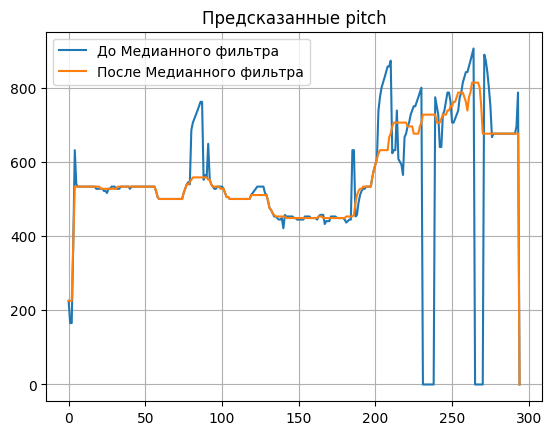

In [141]:
import matplotlib.pyplot as plt

plt.plot(pitches_before, label='До Медианного фильтра')
plt.plot(pitches_after, label='После Медианного фильтра')
plt.grid(); plt.legend()
plt.title('Предсказанные pitch')
plt.show()

Задание:
1. Используйте каждый экстрактор
2. Субъективно оцените
3. Напишите выводы